In [1]:
import os
import io
import re
import time
import gc
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import pathlib
from pathlib import Path
from sklearn.metrics import f1_score

from tensorflow.keras.applications.efficientnet import EfficientNetB3, preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, BatchNormalization
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras import optimizers, backend as K
from tensorflow.keras import layers, optimizers, Model

In [2]:
# -------------------------------------------------
# Configuración de la GPU (si está disponible)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print("GPUs disponibles:")
    for i, gpu in enumerate(gpus):
        details = tf.config.experimental.get_device_details(gpu)
        gpu_name = details.get('device_name', gpu.name)
        print(f" - GPU {i+1}: {gpu_name}")
    try:
        tf.config.set_visible_devices(gpus[0], 'GPU')
        details = tf.config.experimental.get_device_details(gpus[0])
        gpu_name = details.get('device_name', gpus[0].name)
        print(f"Se utilizará la GPU: {gpu_name}")
    except RuntimeError:
        print("Advertencia: No se pudo configurar la GPU porque TF ya está inicializado.")
else:
    print("No se detectaron GPUs.")

AUTOTUNE = tf.data.AUTOTUNE  # Para procesamiento paralelo

GPUs disponibles:
 - GPU 1: NVIDIA GeForce RTX 3050 Laptop GPU
Se utilizará la GPU: NVIDIA GeForce RTX 3050 Laptop GPU


In [3]:
# Directorio de salida del modelo
cv_pth = r'C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\1_CNN_Training\RESULT\CV_5_folds' 
data_dir = pathlib.Path(cv_pth)

In [4]:
# DATOS DE ENTRADA
# Setear ruta global de los 5 folds 
tr_pth = r'C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\0_Mels_Gen\Result\CV_5' 
data_dir = pathlib.Path(tr_pth)

In [5]:
# Listar e imprimir las rutas de cada fold
fold_dirs = []
for fold in os.listdir(tr_pth):
    fold_path = os.path.join(tr_pth, fold)
    if os.path.isdir(fold_path):
        print(fold_path)
        fold_dirs.append(fold_path)
fold_dirs = sorted(fold_dirs)  # Ordenar por nombre

C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\0_Mels_Gen\Result\CV_5\fold_1
C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\0_Mels_Gen\Result\CV_5\fold_2
C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\0_Mels_Gen\Result\CV_5\fold_3
C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\0_Mels_Gen\Result\CV_5\fold_4
C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\0_Mels_Gen\Result\CV_5\fold_5


In [6]:
folds = [Path(os.path.join(tr_pth, folder)) for folder in sorted(os.listdir(tr_pth)) if os.path.isdir(os.path.join(tr_pth, folder))]
fold_1, fold_2, fold_3, fold_4, fold_5 = folds

In [7]:
# Setear ruta para 4 folds (equivalentes al total de folds usados para el entrenamiento en cada iteración)
dir_folds = [fold_2, fold_3, fold_4, fold_5]

# Funciones

In [8]:
BATCH_SIZE = 16
IMG_HEIGHT = 300
IMG_WIDTH = 300
im_size = (IMG_HEIGHT, IMG_WIDTH)

In [9]:
# Funciones de procesamiento (sin cambios)
def get_label(file_path):
  # convert the path to a list of path components
  parts = tf.strings.split(file_path, os.path.sep)
  # The second to last is the class-directory
  return parts[-2] == CLASS_NAMES

def decode_img(img):
    """
    Decodifica una imagen PNG, la castea a float32 sin escalar (manteniendo los valores [0,255])
    y la redimensiona al tamaño deseado.
    """
    img = tf.image.decode_png(img, channels=3)
    # Convertir a float32 sin normalizar (los píxeles se conservarán en [0,255])
    img = tf.cast(img, tf.float32)
    img = tf.image.resize(img, [IMG_HEIGHT, IMG_WIDTH])
    return img

def process_path(file_path):
    label = get_label(file_path)
    img = tf.io.read_file(file_path)
    img = decode_img(img)
    return img, label

In [10]:
def prepare_for_training(ds, cache=True, shuffle_buffer_size=1000, repeat=1):
    if cache:
        ds = ds.cache() if not isinstance(cache, str) else ds.cache(cache)
    ds = ds.shuffle(buffer_size=shuffle_buffer_size)
    ds = ds.repeat(repeat)
    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

def show_batch(image_batch, label_batch):
    plt.figure(figsize=(10, 10))
    for n in range(min(16, image_batch.shape[0])):
        ax = plt.subplot(4, 4, n + 1)
        # Convertir la imagen de [0,255] a [0,1]
        img = image_batch[n] / 255.0
        plt.imshow(img.numpy())
        plt.title(CLASS_NAMES[label_batch[n].numpy()])
        plt.axis('off')
    plt.show()

# Prepare data and image analysis

In [11]:
# Inicializar el conteo total de imágenes
total_image_count = 0

# Recorrer cada carpeta en dir_folds
for fold in dir_folds:
    # Listar archivos dentro de las subcarpetas (ejemplo: subdirectorios con imágenes)
    list_ds = tf.data.Dataset.list_files(str(fold / '*/*'))
    # (Este bucle es solo ilustrativo, se recorre para conteo si fuera necesario)
    for f in list_ds:
        pass

    # Contar imágenes con extensión .png dentro de las subcarpetas de cada fold
    image_count = len(list(tf.data.Dataset.list_files(str(fold / '*/*.png'))))
    total_image_count += image_count
    print(f"Conteo de imágenes en {fold}: {image_count}")

print("Conteo total de imágenes en los cuatro folds:", total_image_count)

Conteo de imágenes en C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\0_Mels_Gen\Result\CV_5\fold_2: 1115
Conteo de imágenes en C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\0_Mels_Gen\Result\CV_5\fold_3: 1115
Conteo de imágenes en C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\0_Mels_Gen\Result\CV_5\fold_4: 1114
Conteo de imágenes en C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\0_Mels_Gen\Result\CV_5\fold_5: 1114
Conteo total de imágenes en los cuatro folds: 4458


In [12]:
# Recorrer las subcarpetas de fold_1 y obtener sus nombres
CLASS_NAMES = np.array([item.name for item in fold_1.iterdir() if item.is_dir()])
print(CLASS_NAMES)

['BI' 'EM' 'S' 'TM' 'VM']


In [13]:
# Inicializar listas para cada fold
folds_list = {f"fold_{i+1}": [] for i in range(5)}

# Iterar sobre cada fold
for i in range(5):
    # Listar archivos en las subcarpetas de cada fold: 'BI', 'EM', 'S', 'TM', 'VM'
    list_ds = tf.data.Dataset.list_files(os.path.join(data_dir, f'fold_{i+1}', '*/*'))
    
    # Almacenar las rutas de las imágenes en la lista correspondiente
    for f in list_ds:
        folds_list[f"fold_{i+1}"].append(f.numpy().decode('utf-8'))

# Imprimir el conteo de imágenes en cada fold según sus rutas (de directorio)
for key, paths in folds_list.items():
    print(f"{key}: {len(paths)} imagenes")

fold_1: 1116 imagenes
fold_2: 1115 imagenes
fold_3: 1115 imagenes
fold_4: 1114 imagenes
fold_5: 1114 imagenes


In [14]:
# LISTAS CON RUTAS DE ACCESO A LAS IMAGENES DE ENTRENAMIENTO 
# SEGÚN CADA AGRUPACIÓN DE FOLDS  POR CADA ITERACIÓN CORRESPONDIENTE

# Crear listas para cada iteración, de modo que se exluya el fold que se tomará como validación según corresponda

list_ds_it_1 = folds_list["fold_2"] + folds_list["fold_3"] + folds_list["fold_4"] + folds_list["fold_5"]
list_ds_it_2 = folds_list["fold_1"] + folds_list["fold_3"] + folds_list["fold_4"] + folds_list["fold_5"]
list_ds_it_3 = folds_list["fold_1"] + folds_list["fold_2"] + folds_list["fold_4"] + folds_list["fold_5"]
list_ds_it_4 = folds_list["fold_1"] + folds_list["fold_2"] + folds_list["fold_3"] + folds_list["fold_5"]
list_ds_it_5 = folds_list["fold_1"] + folds_list["fold_2"] + folds_list["fold_3"] + folds_list["fold_4"]

# Imprimir el conteo de imágenes según sus rutas para cada iteración
print(f"list_ds_it_1: {len(list_ds_it_1)} imagenes")
print(f"list_ds_it_2: {len(list_ds_it_2)} imagenes")
print(f"list_ds_it_3: {len(list_ds_it_3)} imagenes")
print(f"list_ds_it_4: {len(list_ds_it_4)} imagenes")
print(f"list_ds_it_5: {len(list_ds_it_5)} imagenes")

list_ds_it_1: 4458 imagenes
list_ds_it_2: 4459 imagenes
list_ds_it_3: 4459 imagenes
list_ds_it_4: 4460 imagenes
list_ds_it_5: 4460 imagenes


In [15]:
# EJEMPLOS DE 3 PNGS SEGÚN CADA ITERACIÓN

# Hacer una copia de las listas primero
list_ds_it_1_c = list_ds_it_1
list_ds_it_2_c = list_ds_it_2
list_ds_it_3_c = list_ds_it_3
list_ds_it_4_c = list_ds_it_4 
list_ds_it_5_c = list_ds_it_5

# Bucle para procesar un ejemplo de 3 rutas de imágenes según cada iteración
for i, list_ds in enumerate([list_ds_it_1_c, list_ds_it_2_c, list_ds_it_3_c, list_ds_it_4_c, list_ds_it_5_c], start=1):
    # Convertimos las listas a un datasets
    list_ds = tf.data.Dataset.from_tensor_slices(list_ds)
    
    # Barajamos el dataset y tomamos 3 elementos aleatorios
    print(f"Ejemplos de rutas de imágenes para la iteración {i}:")
    for f in list_ds.shuffle(buffer_size=len(list_ds)).take(3):
        print(f.numpy())
    print()  # Línea en blanco para separar las salidas

Ejemplos de rutas de imágenes para la iteración 1:
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_4\\S\\24347-8-0-66_seg1.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_2\\EM\\95562-4-3-1_seg2.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_3\\TM\\166101-5-2-2_seg1.png'

Ejemplos de rutas de imágenes para la iteración 2:
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_1\\EM\\144351-4-3-1_seg1.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_3\\EM\\75743-0-0-7_seg1.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_1\\BI\\180052-3-0-4_seg2.png'

Ejemplos de rutas de imágenes para la iteración 3:
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_2\\BI\\193394-3-0-7_seg1.png'
b'C:\\Users\\cadur\\Do

In [16]:
# ETIQUETAR LOS DATASETS PARA CADA ITERACIÓN
# Aplicamos la función map a cada lista en un bucle para procesar las rutas, en clave
# de la decodificación de la imagen y su asociación con la etiqueta correspondiente
labeled_datasets = []

for list_ds in [list_ds_it_1, list_ds_it_2, list_ds_it_3, list_ds_it_4, list_ds_it_5]:
    # Convertimos la lista a un Dataset (para poder aplicar la función map)
    dataset = tf.data.Dataset.from_tensor_slices(list_ds)
    
    # Etiquetamos con la función proccess_path
    labeled_ds = dataset.map(process_path, num_parallel_calls=AUTOTUNE)
    
    # Almacenamos el resultado
    labeled_datasets.append(labeled_ds)

# Acceso individual a los datasets etiquetados
labeled_ds_1, labeled_ds_2, labeled_ds_3, labeled_ds_4, labeled_ds_5 = labeled_datasets

In [17]:
# Revisar las dimensiones de las imágenes y las etiquetas en los datasets etiquetados según cada iteración
for i, labeled_ds in enumerate([labeled_ds_1, labeled_ds_2, labeled_ds_3, labeled_ds_4, labeled_ds_5], start=1):
    print(f"\nRevisando labeled_ds_it_{i}:")
    for image, label in labeled_ds.take(1):  # Toma solo un ejemplo de cada lista
        print("Image shape: ", image.numpy().shape)
        print("Label: ", label.numpy())


Revisando labeled_ds_it_1:
Image shape:  (300, 300, 3)
Label:  [False False  True False False]

Revisando labeled_ds_it_2:
Image shape:  (300, 300, 3)
Label:  [False False False False  True]

Revisando labeled_ds_it_3:
Image shape:  (300, 300, 3)
Label:  [False False False False  True]

Revisando labeled_ds_it_4:
Image shape:  (300, 300, 3)
Label:  [False False False False  True]

Revisando labeled_ds_it_5:
Image shape:  (300, 300, 3)
Label:  [False False False False  True]


Muestra del batch para las imágenes de entrenamiento de la iteración 1:


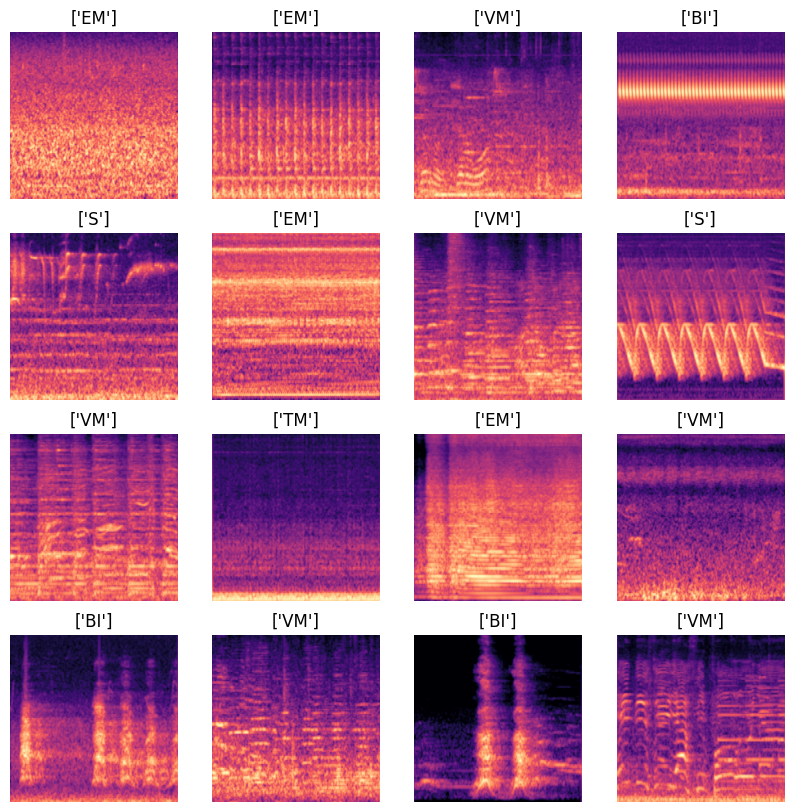

Muestra del batch para las imágenes de entrenamiento de la iteración 2:


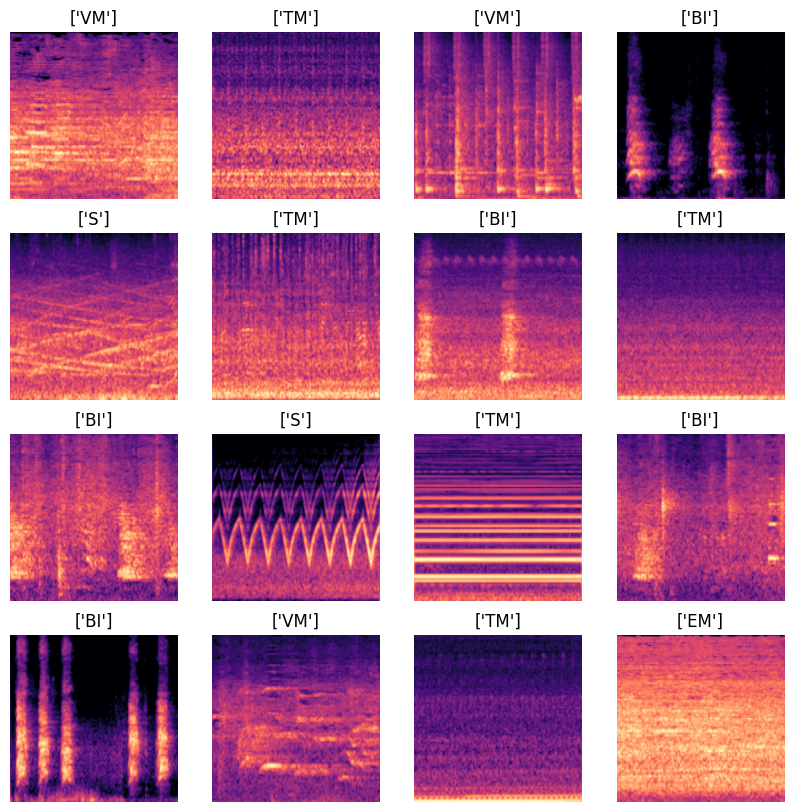

Muestra del batch para las imágenes de entrenamiento de la iteración 3:


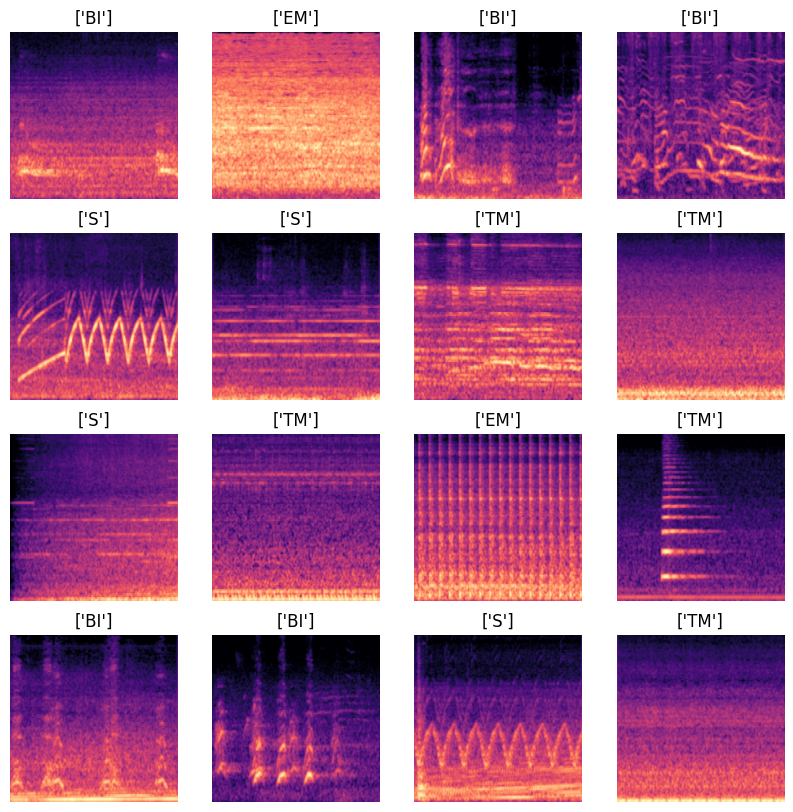

Muestra del batch para las imágenes de entrenamiento de la iteración 4:


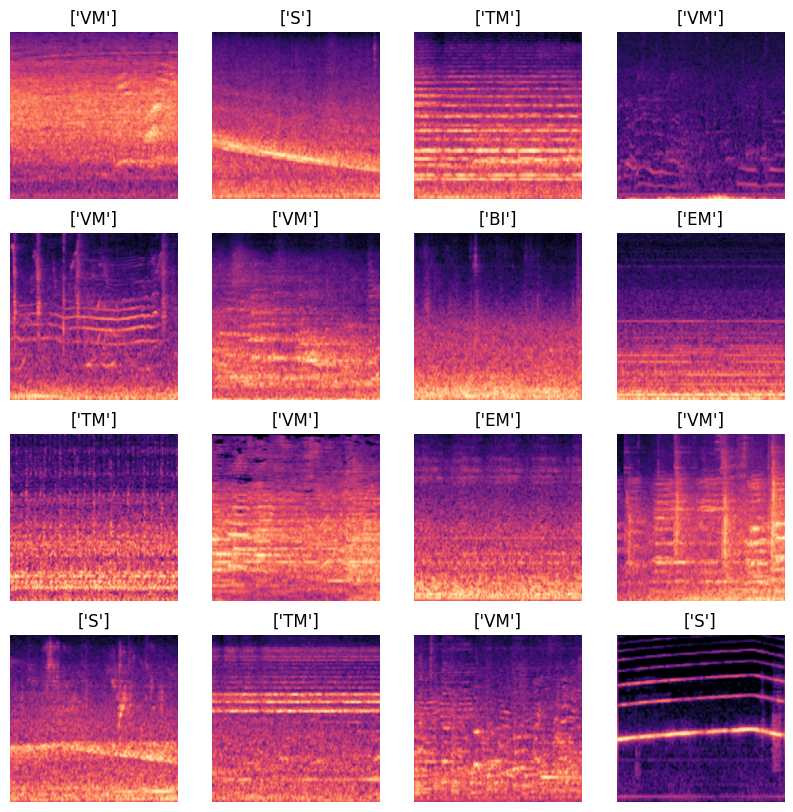

Muestra del batch para las imágenes de entrenamiento de la iteración 5:


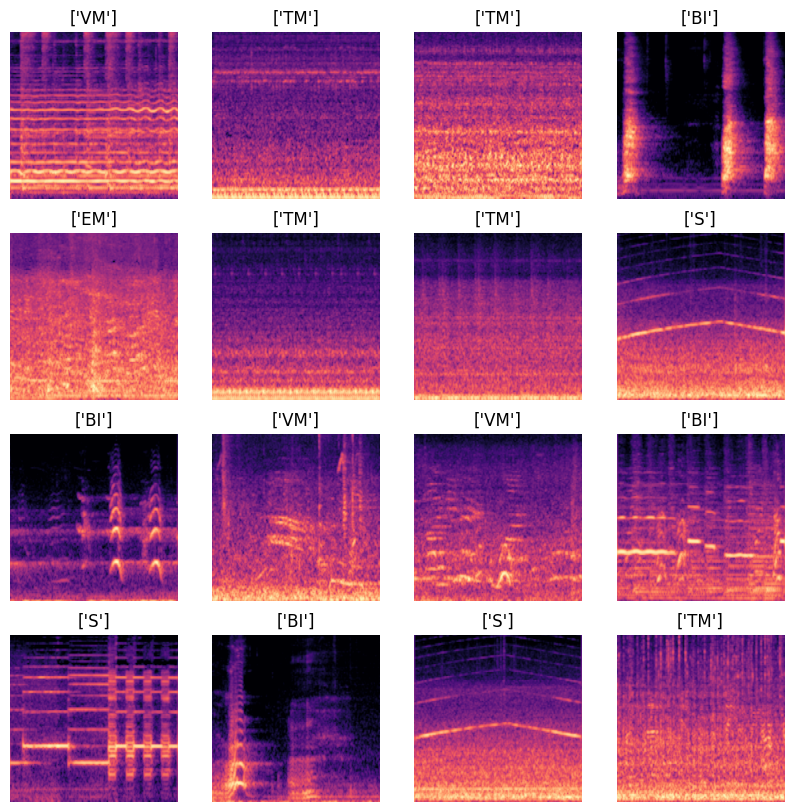

In [18]:
# PREPARAR LAS IMÁGENES DE ENTRENAMIENTO PARA CADA ITERACIÓN
# Se aplica la función "prepare_for_training" a los datasets etiquetados para tener finalmente listas las imagene de entrenamiento

train_datasets = []

# Prep dataset iterations and display some PNGs
for i, labeled_ds in enumerate([labeled_ds_1, labeled_ds_2, labeled_ds_3, labeled_ds_4, labeled_ds_5], start=1):  # Iterar de 1 a 5
    train_ds = prepare_for_training(labeled_ds, repeat=None)  # Preparar el dataset
    image_batch, label_batch = next(iter(train_ds))  # Obtener un batch de imágenes y etiquetas
    
    # Mostrar el batch de imágenes y etiquetas
    print(f"Muestra del batch para las imágenes de entrenamiento de la iteración {i}:")
    show_batch(image_batch, label_batch)  # Llamar a la función show_batch
    plt.show()  # Mostrar el plot y esperar a que se cierre antes de continuar

    # Almacenamos el resultado
    train_datasets.append(train_ds)

# Acceso a los dataset de entrenamiento preparados
train_ds_1, train_ds_2, train_ds_3, train_ds_4, train_ds_5 = train_datasets

# Validation data

In [19]:
# Se cuenta la cantidad de imágenes en fold_1 (validación) 
val_image_count = len(list(fold_1.glob('*/*.png')))
val_image_count

1116

In [20]:
# Recorrer las subcarpetas de fold_1 y obtener sus nombres
CLASS_NAMES = np.array([item.name for item in fold_1.iterdir() if item.is_dir()])
print(CLASS_NAMES)

['BI' 'EM' 'S' 'TM' 'VM']


In [21]:
# The 1./255 is to convert from uint8 to float32 in range [0,1].
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
STEPS_PER_EPOCH = np.ceil(val_image_count/BATCH_SIZE)

In [22]:
# LISTAS CON RUTAS DE ACCESO A LOS 5 FOLD

# Inicializar listas para cada fold
folds_val = {f"fold_{i+1}": [] for i in range(5)}

# Iterar sobre cada fold
for i in range(5):
    # Listar archivos en las subcarpetas de cada fold: 'BI', 'EM', 'S', 'TM', 'VM'
    list_ds = tf.data.Dataset.list_files(os.path.join(data_dir, f'fold_{i+1}', '*/*'))
    
    # Almacenar las rutas de las imágenes en la lista correspondiente
    for f in list_ds:
        folds_val[f"fold_{i+1}"].append(f.numpy().decode('utf-8'))

# Imprimir el conteo de imagenes en cada fold según sus rutas
for key, paths in folds_val.items():
    print(f"{key}: {len(paths)} imagenes")

fold_1: 1116 imagenes
fold_2: 1115 imagenes
fold_3: 1115 imagenes
fold_4: 1114 imagenes
fold_5: 1114 imagenes


In [23]:
# LISTAS CON RUTAS DE ACCESO A LAS IMAGENES DE VALIDACIÓN

# Crear listas para cada iteración, de modo que segun cada iteración se tome uno de los folds

list_ds_it_1 = folds_list["fold_1"]
list_ds_it_2 = folds_list["fold_2"]
list_ds_it_3 = folds_list["fold_3"]
list_ds_it_4 = folds_list["fold_4"]
list_ds_it_5 = folds_list["fold_5"]

# Imprimir el conteo de imágenes según sus rutas para cada iteración
print(f"list_ds_it_1: {len(list_ds_it_1)} imagenes")
print(f"list_ds_it_2: {len(list_ds_it_2)} imagenes")
print(f"list_ds_it_3: {len(list_ds_it_3)} imagenes")
print(f"list_ds_it_4: {len(list_ds_it_4)} imagenes")
print(f"list_ds_it_5: {len(list_ds_it_5)} imagenes")

list_ds_it_1: 1116 imagenes
list_ds_it_2: 1115 imagenes
list_ds_it_3: 1115 imagenes
list_ds_it_4: 1114 imagenes
list_ds_it_5: 1114 imagenes


In [24]:
# EJEMPLOS DE 3 PNGS SEGÚN CADA ITERACIÓN

# Hacer una copia de las listas primero

list_ds_it_1_c = list_ds_it_1
list_ds_it_2_c = list_ds_it_2
list_ds_it_3_c = list_ds_it_3
list_ds_it_4_c = list_ds_it_4 
list_ds_it_5_c = list_ds_it_5

# Bucle para procesar un ejemplo de 3 rutas de imágenes según cada iteración
for i, list_ds in enumerate([list_ds_it_1_c, list_ds_it_2_c, list_ds_it_3_c, list_ds_it_4_c, list_ds_it_5_c], start=1):
    # Convertimos las listas a un datasets
    list_ds = tf.data.Dataset.from_tensor_slices(list_ds)
    
    # Barajamos el dataset y tomamos 3 elementos aleatorios
    print(f"Ejemplos de rutas de imágenes para la iteración {i}:")
    for f in list_ds.shuffle(buffer_size=len(list_ds)).take(3):
        print(f.numpy())
    print()  # Línea en blanco para separar las salidas

Ejemplos de rutas de imágenes para la iteración 1:
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_1\\VM\\14470-2-0-4_seg2.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_1\\TM\\200786-5-1-4_seg2.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_1\\S\\157868-8-0-5_seg2.png'

Ejemplos de rutas de imágenes para la iteración 2:
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_2\\BI\\117271-3-0-3_seg1.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_2\\BI\\122199-3-1-3_seg1.png'
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_2\\TM\\106905-5-0-2_seg1.png'

Ejemplos de rutas de imágenes para la iteración 3:
b'C:\\Users\\cadur\\Downloads\\Urbansonic\\Urbansound8k\\0_Mels_Gen\\Result\\CV_5\\fold_3\\S\\159750-8-0-2_seg2.png'
b'C:\\Users\\cadur\\Do

In [25]:
# ETIQUETAR LOS DATASETS PARA CADA ITERACIÓN
# Aplicamos la función map a cada lista en un bucle para procesar las rutas, en clave
# de la decodificación de la imagen y su asociación con la etiqueta correspondiente
labeled_datasets = []

for list_ds in [list_ds_it_1, list_ds_it_2, list_ds_it_3, list_ds_it_4, list_ds_it_5]:
    # Convertimos la lista a un Dataset (para poder aplicar la función map)
    dataset = tf.data.Dataset.from_tensor_slices(list_ds)
    
    # Etiquetamos con la función proccess_path
    labeled_ds = dataset.map(process_path, num_parallel_calls=AUTOTUNE)
    
    # Almacenamos el resultado
    labeled_datasets.append(labeled_ds)

# Acceso individual a los datasets etiquetados
labeled_ds_1, labeled_ds_2, labeled_ds_3, labeled_ds_4, labeled_ds_5 = labeled_datasets

# Revisar las dimensiones de las imágenes y las etiquetas en los datasets etiquetados según cada iteración
for i, labeled_ds in enumerate([labeled_ds_1, labeled_ds_2, labeled_ds_3, labeled_ds_4, labeled_ds_5], start=1):
    print(f"\nRevisando labeled_ds_it_{i}:")
    for image, label in labeled_ds.take(1):  # Toma solo un ejemplo de cada lista
        print("Image shape: ", image.numpy().shape)
        print("Label: ", label.numpy())


Revisando labeled_ds_it_1:
Image shape:  (300, 300, 3)
Label:  [False False False False  True]

Revisando labeled_ds_it_2:
Image shape:  (300, 300, 3)
Label:  [False False  True False False]

Revisando labeled_ds_it_3:
Image shape:  (300, 300, 3)
Label:  [False False False False  True]

Revisando labeled_ds_it_4:
Image shape:  (300, 300, 3)
Label:  [False False  True False False]

Revisando labeled_ds_it_5:
Image shape:  (300, 300, 3)
Label:  [False False False  True False]


Muestra del batch para las imágenes de validación de la iteración 1:


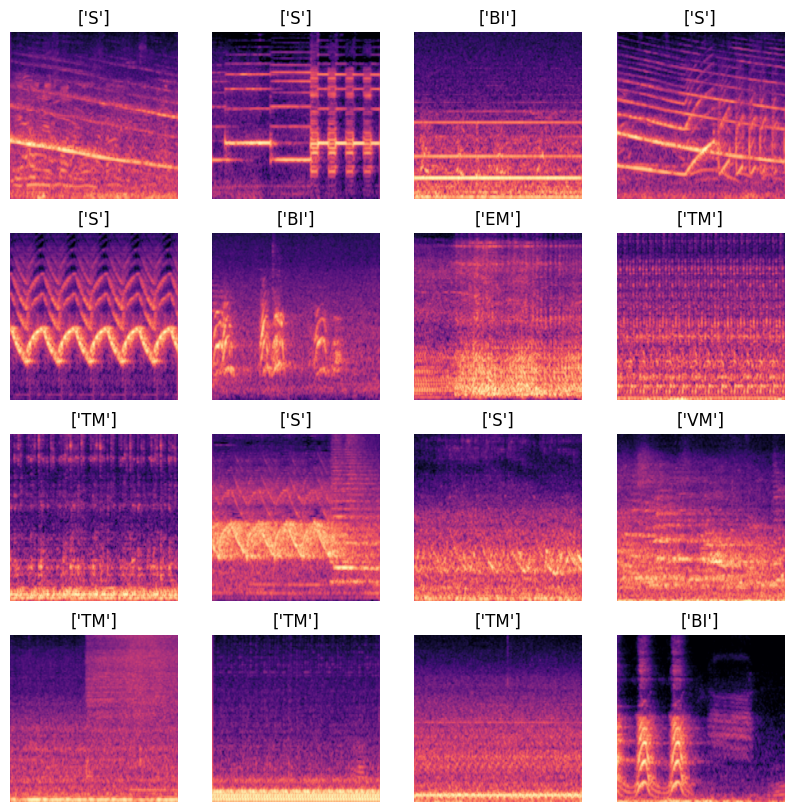

Muestra del batch para las imágenes de validación de la iteración 2:


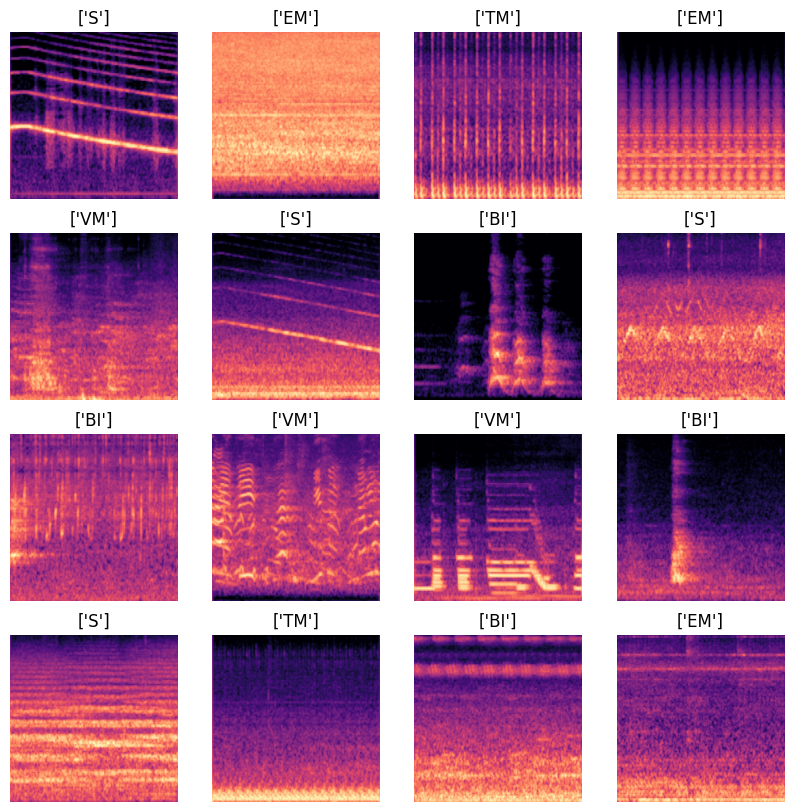

Muestra del batch para las imágenes de validación de la iteración 3:


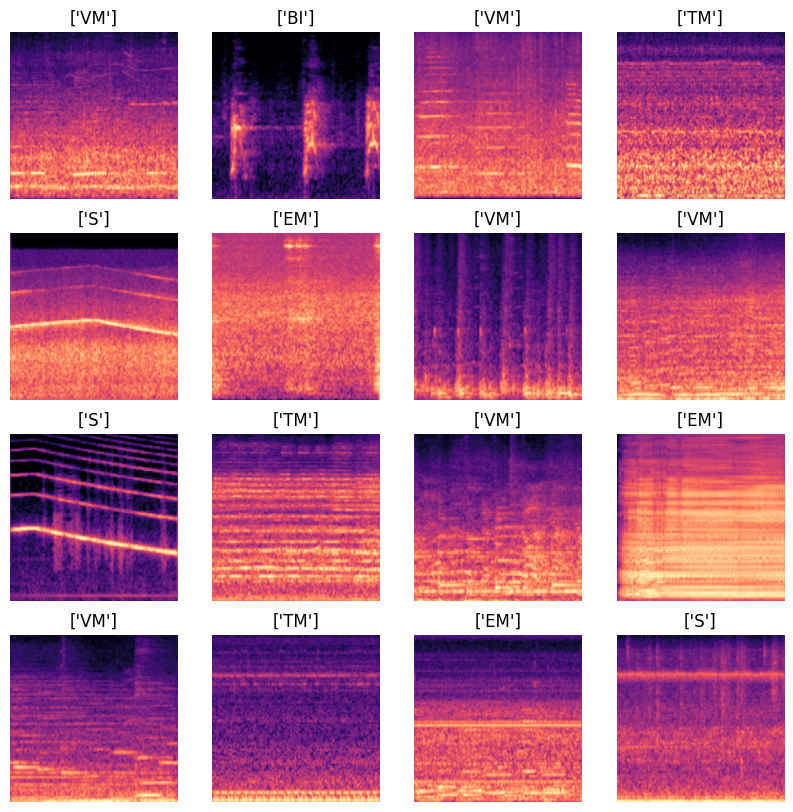

Muestra del batch para las imágenes de validación de la iteración 4:


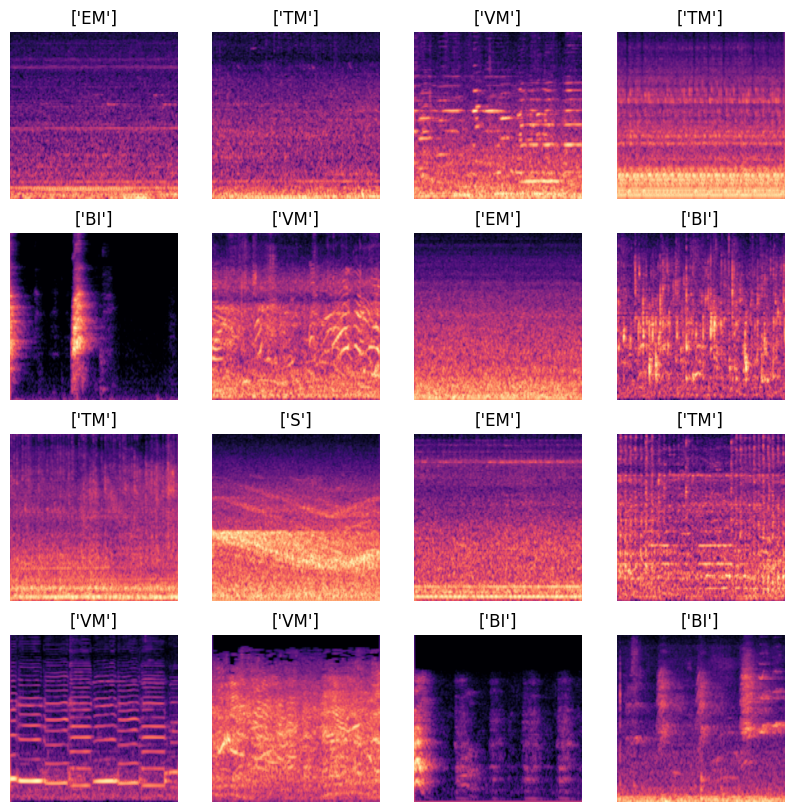

Muestra del batch para las imágenes de validación de la iteración 5:


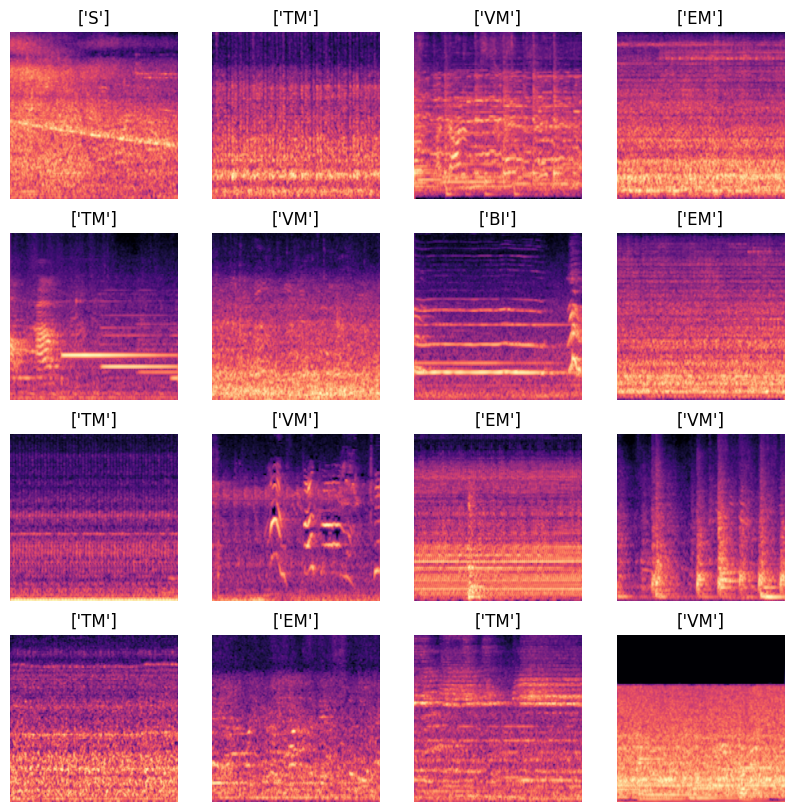

In [26]:
# PREPARAR LAS IMÁGENES DE VALIDACIÓN PARA CADA ITERACIÓN
# Se aplica la función "prepare_for_training" a los datasets etiquetados para tener finalmente listas las imagene de validación

validation_datasets = []

# Prep dataset iterations and display some PNGs
for i, labeled_ds in enumerate([labeled_ds_1, labeled_ds_2, labeled_ds_3, labeled_ds_4, labeled_ds_5], start=1):  # Iterar de 1 a 5
    validation_ds = prepare_for_training(labeled_ds)  # Preparar el dataset
    image_batch, label_batch = next(iter(validation_ds))  # Obtener un batch de imágenes y etiquetas
    
    # Mostrar el batch de imágenes y etiquetas
    print(f"Muestra del batch para las imágenes de validación de la iteración {i}:")
    show_batch(image_batch, label_batch)  # Llamar a la función show_batch
    plt.show()  # Mostrar el plot y esperar a que se cierre antes de continuar

    # Almacenamos el resultado
    validation_datasets.append(validation_ds)

# Acceso a los dataset de validación preparados
validation_ds_1, validation_ds_2, validation_ds_3, validation_ds_4, validation_ds_5 = validation_datasets

# Verificacion de Datos

In [27]:
# NOW WE HAVE
print(train_ds_1)
print(train_ds_2)
print(train_ds_3)
print(train_ds_4)
print(train_ds_5)
print()
print(validation_ds_1)
print(validation_ds_2)
print(validation_ds_3)
print(validation_ds_4)
print(validation_ds_5)

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.bool, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.bool, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.bool, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.bool, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.bool, name=None))>

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.bool, name=None))>
<PrefetchDataset element_spec=(TensorSpec(shape=(None, 300, 300, 3), 

# MODEL TRAINING

In [28]:
# number of target class : ABGIQ
n_classes = len(CLASS_NAMES)
print(n_classes)
print(CLASS_NAMES)

5
['BI' 'EM' 'S' 'TM' 'VM']


In [29]:
# Aquí entrenamos cada fold usando los datasets previamente preparados
initial_epochs = 100  # Número reducido de epochs para pruebas
histories = []      # Lista para almacenar el historial de cada iteración
all_metrics = []  

In [30]:
# Se combinan los datasets de entrenamiento y validación en pares
datasets = list(zip(train_datasets, validation_datasets))
# Para determinar el número total de iteraciones/folds
n_folds = len(datasets)


Iteración 1:
Validación: validation_ds_1
Entrenamiento: train_ds_1

Entrenamiento en iteración 1...

Epoch 1/100
70/70 [==============================] - 41s 415ms/step - loss: 1.5107 - categorical_accuracy: 0.3357 - val_loss: 1.3990 - val_categorical_accuracy: 0.4543
Epoch 2/100
70/70 [==============================] - 22s 322ms/step - loss: 1.3118 - categorical_accuracy: 0.4821 - val_loss: 1.2156 - val_categorical_accuracy: 0.5654
Epoch 3/100
70/70 [==============================] - 23s 338ms/step - loss: 1.1271 - categorical_accuracy: 0.5902 - val_loss: 1.0699 - val_categorical_accuracy: 0.6111
Epoch 4/100
70/70 [==============================] - 23s 326ms/step - loss: 1.0767 - categorical_accuracy: 0.6098 - val_loss: 0.9691 - val_categorical_accuracy: 0.6514
Epoch 5/100
70/70 [==============================] - 22s 313ms/step - loss: 1.0108 - categorical_accuracy: 0.6259 - val_loss: 0.9033 - val_categorical_accuracy: 0.6694
Epoch 6/100
70/70 [==============================] - 22s 3

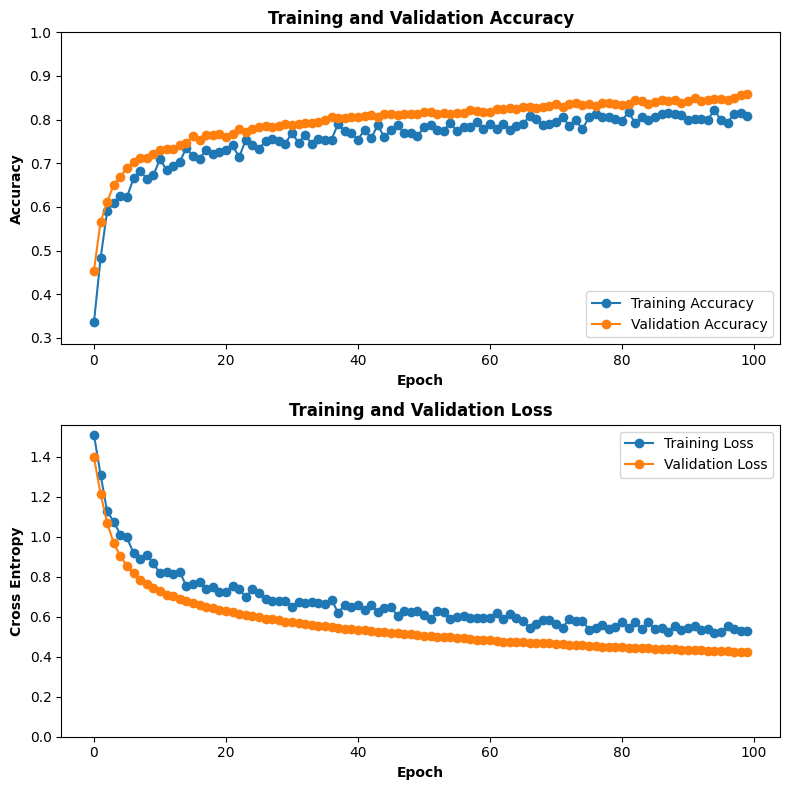

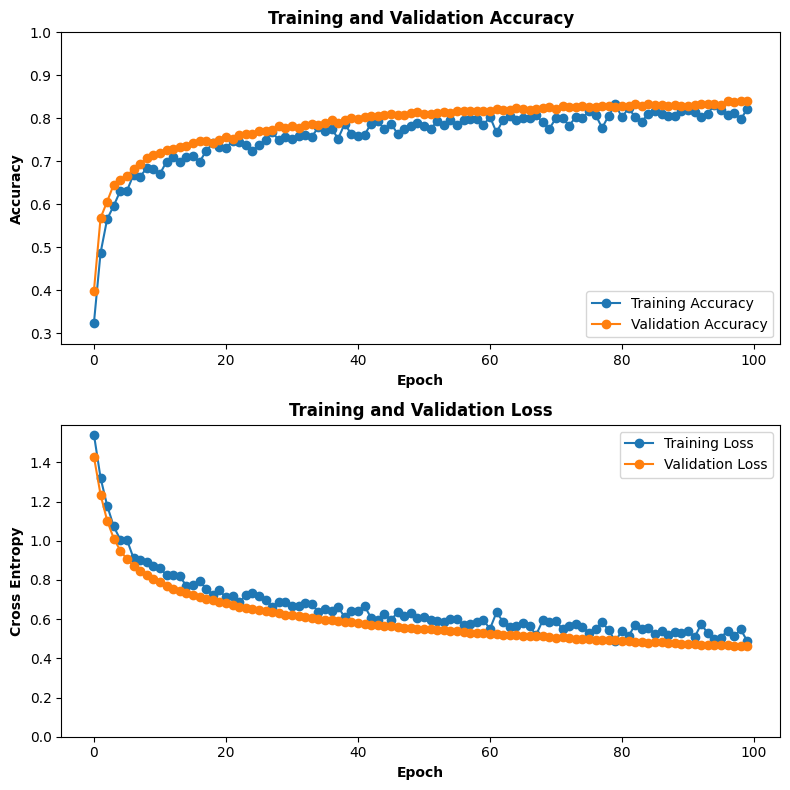

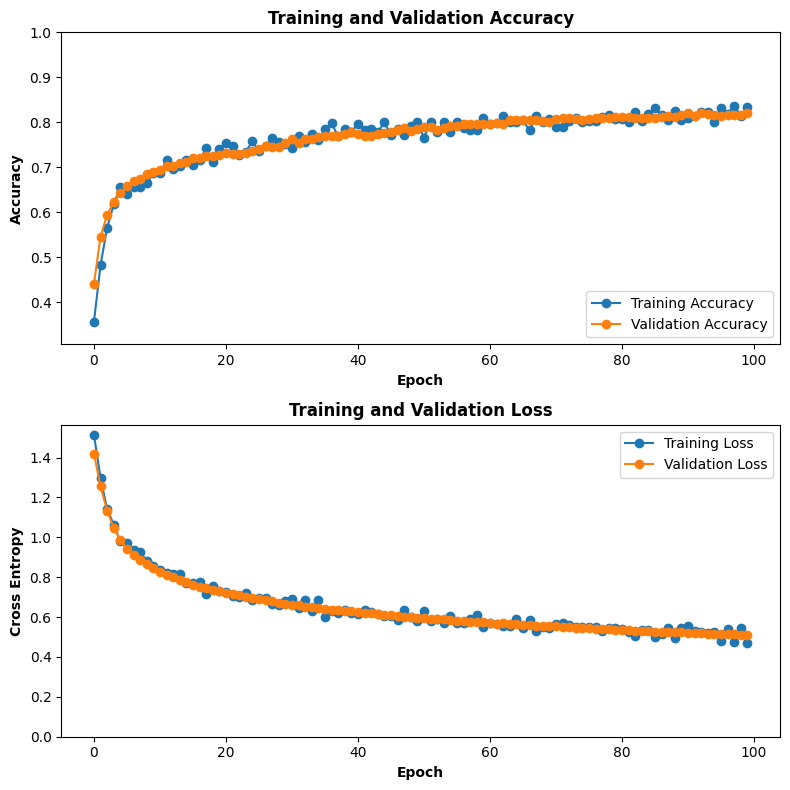

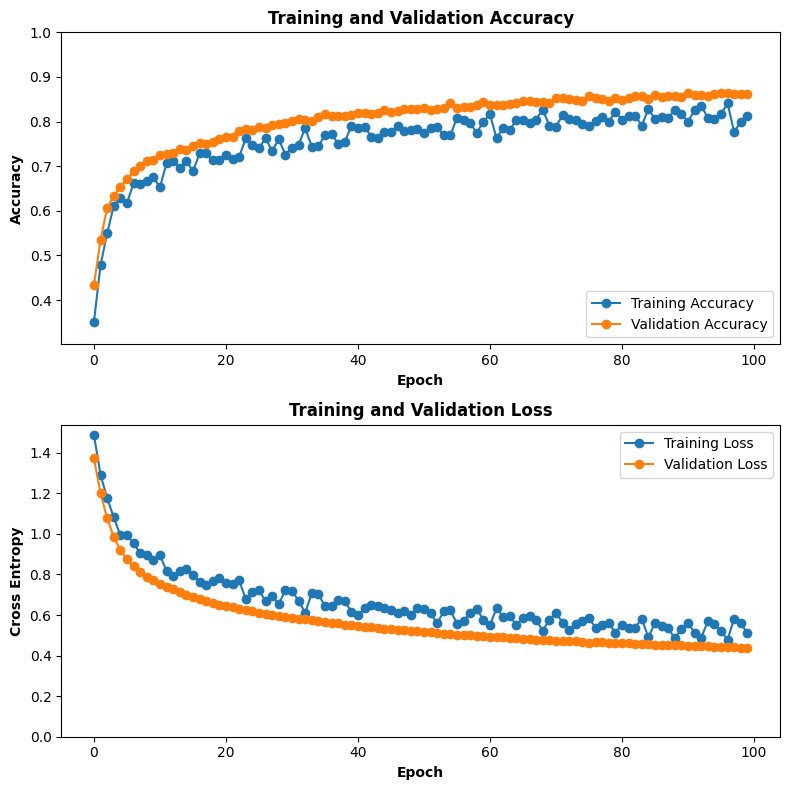

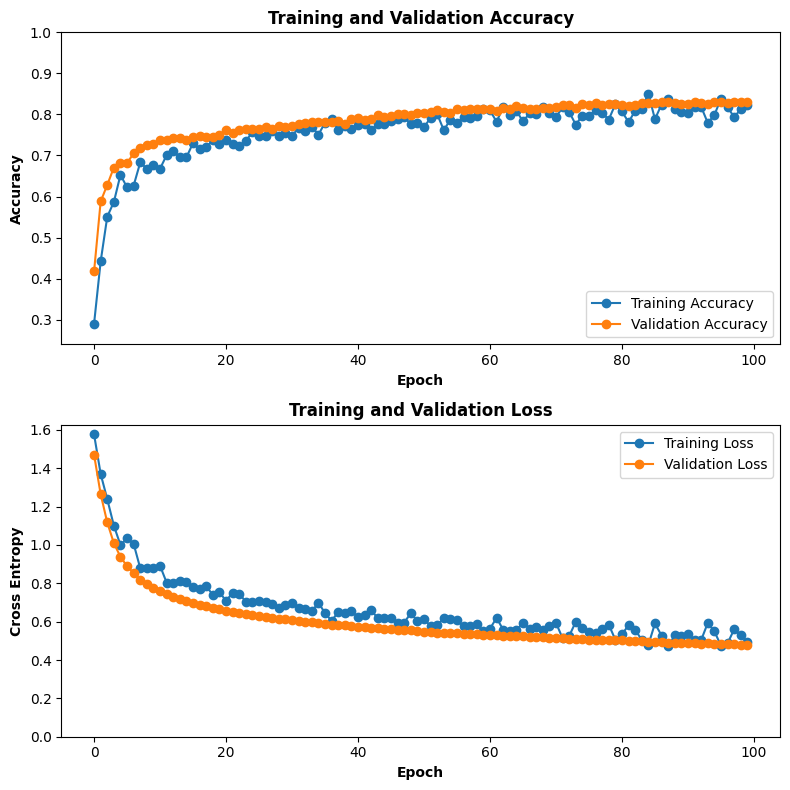

In [31]:
# ---------------------
# Bucle de entrenamiento con 5-fold CV
# ---------------------
for i, (train_ds, validation_ds) in enumerate(datasets, start=1):
    print(f"\nIteración {i}:")
    print(f"Validación: validation_ds_{i}")
    print(f"Entrenamiento: train_ds_{i}\n")
    print(f"Entrenamiento en iteración {i}...\n")

    # -----------------
    # Definición y compilación del modelo
    # -----------------
    base_model_output = EfficientNetB3(
        weights="imagenet",
        input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
        include_top=False
    )
    base_model_output.trainable = False

    model_fold = tf.keras.Sequential([
        base_model_output,
        layers.BatchNormalization(),
        tf.keras.layers.GlobalAveragePooling2D(),
        layers.Dropout(0.2, name="top_dropout"),
        Dense(n_classes, activation="softmax", name="predictions")
    ])

    model_fold.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
        metrics=[tf.keras.metrics.CategoricalAccuracy()],
        loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False)
    )

    # -----------------
    # Entrenamiento
    # -----------------
    history = model_fold.fit(
        train_ds,
        epochs=initial_epochs,
        validation_data=validation_ds,
        steps_per_epoch=np.ceil(image_count / BATCH_SIZE)
    )
    histories.append(history)

    # -----------------
    # Guardar pesos del modelo
    # -----------------
    model_save_path = os.path.join(cv_pth, f"model_fold_{i}.h5")
    model_fold.save_weights(model_save_path)
    print(f"Pesos guardados en: {model_save_path}")

    # -----------------
    # Recuperar curvas de métrica y pérdida
    # -----------------
    acc         = history.history['categorical_accuracy']
    val_acc     = history.history['val_categorical_accuracy']
    loss_values = history.history['loss']
    val_loss    = history.history['val_loss']

    # -----------------
    # Plot de Accuracy y Loss
    # -----------------
    plt.figure(figsize=(8, 8))

    plt.subplot(2, 1, 1)
    plt.plot(acc, marker='o', label='Training Accuracy')
    plt.plot(val_acc, marker='o', label='Validation Accuracy')
    plt.xlabel('Epoch', fontweight='bold')
    plt.ylabel('Accuracy', fontweight='bold')
    plt.title('Training and Validation Accuracy', fontweight='bold')
    plt.legend(loc='lower right')
    plt.ylim([min(min(acc), min(val_acc)) - 0.05, 1])

    plt.subplot(2, 1, 2)
    plt.plot(loss_values, marker='o', label='Training Loss')
    plt.plot(val_loss, marker='o', label='Validation Loss')
    plt.xlabel('Epoch', fontweight='bold')
    plt.ylabel('Cross Entropy', fontweight='bold')
    plt.title('Training and Validation Loss', fontweight='bold')
    plt.legend(loc='upper right')
    plt.ylim([0, max(max(loss_values), max(val_loss)) + 0.05])

    plt.tight_layout()

    # Guardar gráfico a 300 dpi
    fig_save_path = os.path.join(cv_pth, f"metrics_plot_fold_{i}.png")
    plt.savefig(fig_save_path, dpi=300, bbox_inches='tight')
    print(f"Plot de métricas guardado en: {fig_save_path}")

    # -----------------
    # Cálculo de F1-score en validación
    # -----------------
    y_true, y_pred = [], []
    for batch_images, batch_labels in validation_ds:
        preds_batch = model_fold.predict(batch_images, verbose=0)
        y_pred.extend(np.argmax(preds_batch, axis=1))
        y_true.extend(np.argmax(batch_labels.numpy(), axis=1))
    f1_val = f1_score(y_true, y_pred, average='macro')
    print(f"F1 Score (macro) VALIDACIÓN para la iteración {i}: {f1_val:.4f}")

    # -----------------
    # Almacenar todas las métricas de esta iteración
    # -----------------
    all_metrics.append({
        'fold': i,
        'train_accuracy': acc[-1],
        'train_loss': loss_values[-1],
        'val_accuracy': val_acc[-1],
        'val_loss': val_loss[-1],
        'f1_Score': f1_val
    })

In [32]:
# ---------------------
# Guardar CSV con todas las métricas
# ---------------------
results_df = pd.DataFrame(all_metrics)
csv_save_path = os.path.join(cv_pth, "final_metrics.csv")
results_df.to_csv(csv_save_path, index=False)

print(f"\nMétricas finales guardadas en: {csv_save_path}")
print("===== DataFrame de métricas finales =====")
print(results_df)


Métricas finales guardadas en: C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\1_CNN_Training\RESULT\CV_5_folds\final_metrics.csv
===== DataFrame de métricas finales =====
   fold  train_accuracy  train_loss  val_accuracy  val_loss  f1_macro_val
0     1        0.808036    0.526839      0.858423  0.422198      0.853782
1     2        0.822321    0.487542      0.839462  0.462071      0.829897
2     3        0.833036    0.468084      0.820628  0.510985      0.815022
3     4        0.811607    0.510025      0.860862  0.436843      0.851433
4     5        0.822321    0.495916      0.831239  0.479216      0.817847


# Matrix de confucion 

===== Métricas por Clase =====
    precision    recall  f1-score
BI   0.912281  0.800000  0.852459
EM   0.588235  0.875000  0.703518
S    0.889831  0.875000  0.882353
TM   0.897638  0.770270  0.829091
VM   0.783217  0.783217  0.783217



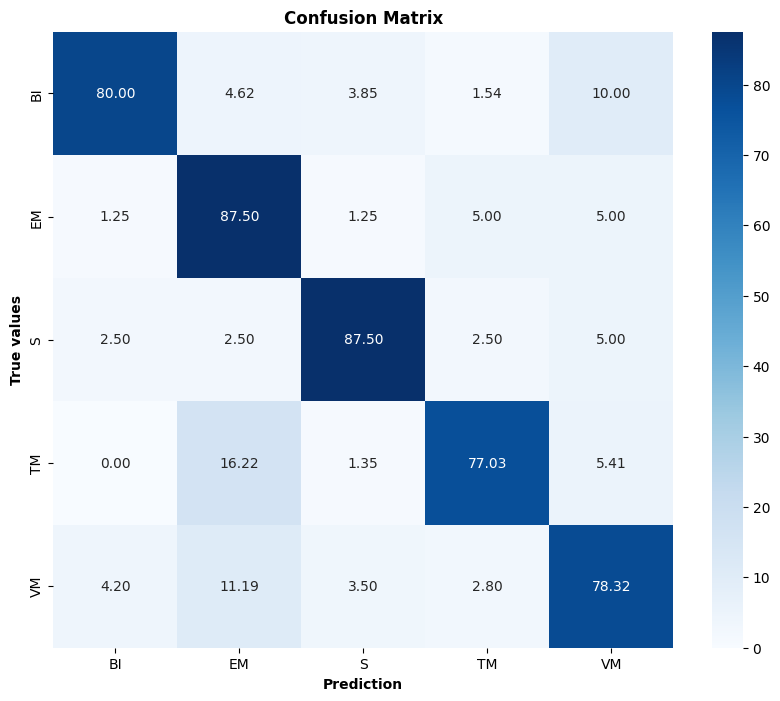

In [36]:
import os
import numpy as np
import tensorflow as tf
from pathlib import Path
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import pandas as pd

# Configuración de rutas y parámetros
TEST_DIR = r"C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\0_Mels_Gen\Result\Split\test"
WEIGHTS_PATH = r"C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\1_CNN_Training\RESULT\CV_5_folds\model_fold_3.h5"

BATCH_SIZE = 16
IMG_HEIGHT = 300
IMG_WIDTH = 300

# Orden de clases tal como se utilizó en el entrenamiento
CLASS_NAMES = np.array(['BI', 'EM', 'S', 'TM', 'VM'])

# Funciones de preprocesamiento
def get_label(file_path):
    parts = tf.strings.split(file_path, os.path.sep)
    return parts[-2] == CLASS_NAMES  # Vector booleano de etiquetas

def decode_img(img):
    img = tf.image.decode_png(img, channels=3)
    img = tf.cast(img, tf.float32)
    img = tf.image.resize(img, [IMG_HEIGHT, IMG_WIDTH])
    return img

def process_path(file_path):
    label = get_label(file_path)
    img = tf.io.read_file(file_path)
    img = decode_img(img)
    return img, label

# Preparar dataset de prueba
test_dir = Path(TEST_DIR)
test_list_ds = tf.data.Dataset.list_files(str(test_dir / '*/*.png'), shuffle=False)
test_ds = test_list_ds.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = test_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# Reconstruir el modelo
def crear_modelo():
    base_model = tf.keras.applications.EfficientNetB3(
        include_top=False,
        weights=None,
        input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)
    )
    base_model.trainable = False  # Congelar base

    modelo = tf.keras.Sequential([
        base_model,
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(len(CLASS_NAMES), activation='softmax')
    ])
    return modelo

modelo = crear_modelo()
modelo.load_weights(WEIGHTS_PATH)  # Cargar pesos entrenados

# Obtener predicciones y etiquetas verdaderas
y_true = []
y_pred = []

for imagenes, etiquetas in test_ds:
    predicciones = modelo.predict(imagenes, verbose=0)
    y_true.extend(tf.argmax(etiquetas, axis=1).numpy())
    y_pred.extend(tf.argmax(predicciones, axis=1).numpy())

# CALCULAR REPORTE DE MÉTRICAS POR CLASE (Precision, Recall, F1-score)
report_dict = classification_report(
    y_true,
    y_pred,
    target_names=CLASS_NAMES,
    output_dict=True
)

# Convertir el reporte a un DataFrame
df_report = pd.DataFrame(report_dict).T

# Filtrar solo las filas correspondientes a cada clase
df_report_clases = df_report.loc[CLASS_NAMES]

# Multiplicar los valores por 100 para expresarlos en porcentajes
df_report_clases[['precision', 'recall', 'f1-score']] = df_report_clases[['precision', 'recall', 'f1-score']]

# Imprimir la tabla en consola
print("===== Métricas por Clase =====")
print(df_report_clases[['precision', 'recall', 'f1-score']])
print()

# CALCULAR Y VISUALIZAR MATRIZ DE CONFUSIÓN NORMALIZADA EN PORCENTAJE
cm = confusion_matrix(y_true, y_pred, labels=np.arange(len(CLASS_NAMES)))
cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

plt.figure(figsize=(10, 8))
sns.heatmap(cm_percent, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
plt.xlabel('Prediction', fontweight='bold')
plt.ylabel('True values', fontweight='bold')
plt.title('Confusion Matrix', fontweight='bold')

# Guardar imagen a 300 dpi
output_path = r'C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\1_CNN_Training\RESULT\CV_5_folds\confusion_matrix.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

In [34]:
# Matriz de confusión (valores absolutos)
cm = confusion_matrix(y_true, y_pred, labels=np.arange(len(CLASS_NAMES)))
df_cm = pd.DataFrame(cm, index=CLASS_NAMES, columns=CLASS_NAMES)

print("===== Matriz de Confusión (valores absolutos) =====")
print(df_cm)

# Matriz normalizada (% por clase verdadera)
cm_percent = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
df_cm_percent = pd.DataFrame(np.round(cm_percent, 2), index=CLASS_NAMES, columns=CLASS_NAMES)

print("\n===== Matriz de Confusión Normalizada (%) =====")
print(df_cm_percent)

===== Matriz de Confusión (valores absolutos) =====
     BI  EM    S   TM   VM
BI  104   6    3    3   14
EM    0  65    2    7    6
S     3   2  105    2    8
TM    0  19    2  121    6
VM    5  11    4    3  120

===== Matriz de Confusión Normalizada (%) =====
      BI     EM      S     TM     VM
BI  80.0   4.62   2.31   2.31  10.77
EM   0.0  81.25   2.50   8.75   7.50
S    2.5   1.67  87.50   1.67   6.67
TM   0.0  12.84   1.35  81.76   4.05
VM   3.5   7.69   2.80   2.10  83.92


# Curva Roc

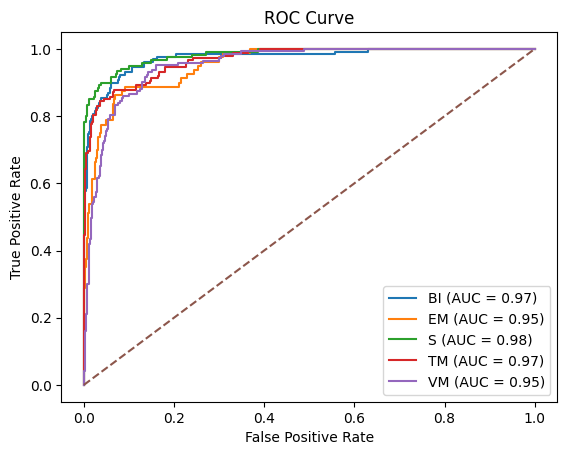

In [35]:
import numpy as np
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import tensorflow as tf

# Supone que test_ds, modelo y CLASS_NAMES ya están definidos
# Obtener probabilidades y etiquetas verdaderas
y_true_int = []
y_score = []
for images, labels in test_ds:
    preds = modelo.predict(images, verbose=0)
    y_score.extend(preds)
    y_true_int.extend(tf.argmax(labels, axis=1).numpy())

y_score = np.array(y_score)
y_true_int = np.array(y_true_int)

# Binarizar etiquetas para multiclasificación
y_true_bin = label_binarize(y_true_int, classes=range(len(CLASS_NAMES)))

# Calcular curvas ROC y AUC para cada clase
fpr = {}
tpr = {}
roc_auc = {}
for i, class_name in enumerate(CLASS_NAMES):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Graficar curva ROC por clase
plt.figure()
for i, class_name in enumerate(CLASS_NAMES):
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--')  # Línea de aleatorio
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')

# Guardar la figura
output_path_roc = r'C:\Users\cadur\Downloads\Urbansonic\Urbansound8k\1_CNN_Training\RESULT\CV_5_folds\roc_curve.png'
plt.savefig(output_path_roc, dpi=300, bbox_inches='tight')
plt.show()